In [3]:
import os
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import pandas as pd
import csv

## Dataset Format

- `gt.txt`: Ground truth annotations. CSV file where each row contains: Frame number, person ID, x, y, width, height

### Plotting one example annotation

In [4]:
DATASET_DIR = Path('..\..\datasets\Cornell\sompt22')
assert DATASET_DIR.exists() and DATASET_DIR.is_dir(), f'{DATASET_DIR} does not exist'

In [5]:
first_scene_fp = DATASET_DIR / 'train' / 'SOMPT22-07'
first_image_fp = first_scene_fp / 'img1' / '000001.jpg'

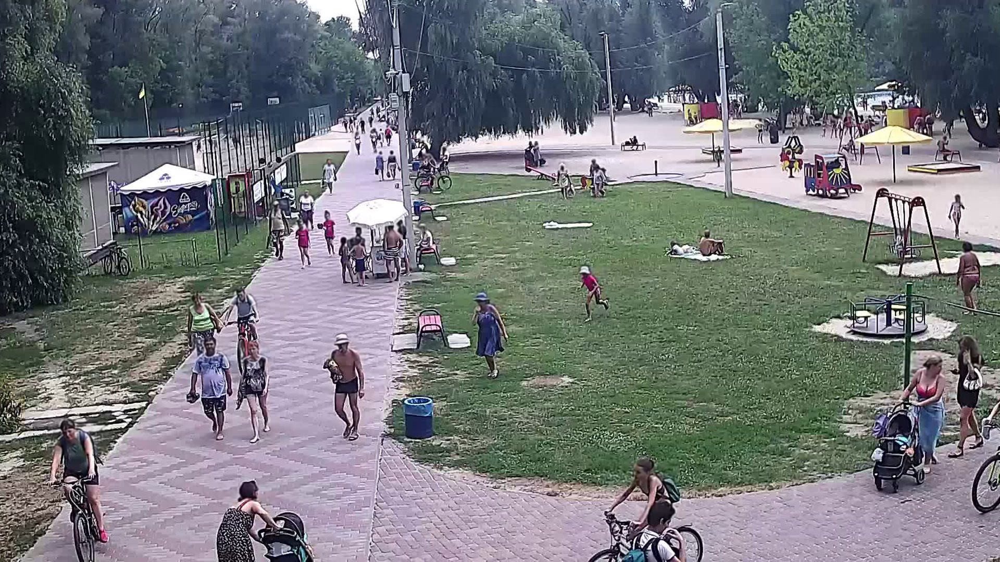

In [6]:
first_image = Image.open(first_image_fp)
first_image

In [7]:
first_gt_fp = first_scene_fp / 'gt' / 'gt.txt'
with open(first_gt_fp, 'r') as gt_f:
    reader = csv.reader(gt_f)
    first_gts = list(reader)
len(first_gts)

82525

In [8]:
frame, id, x, y, width, height, *_ = first_gts[0]
x = int(x)
y = int(y)
width = int(width)
height = int(height)

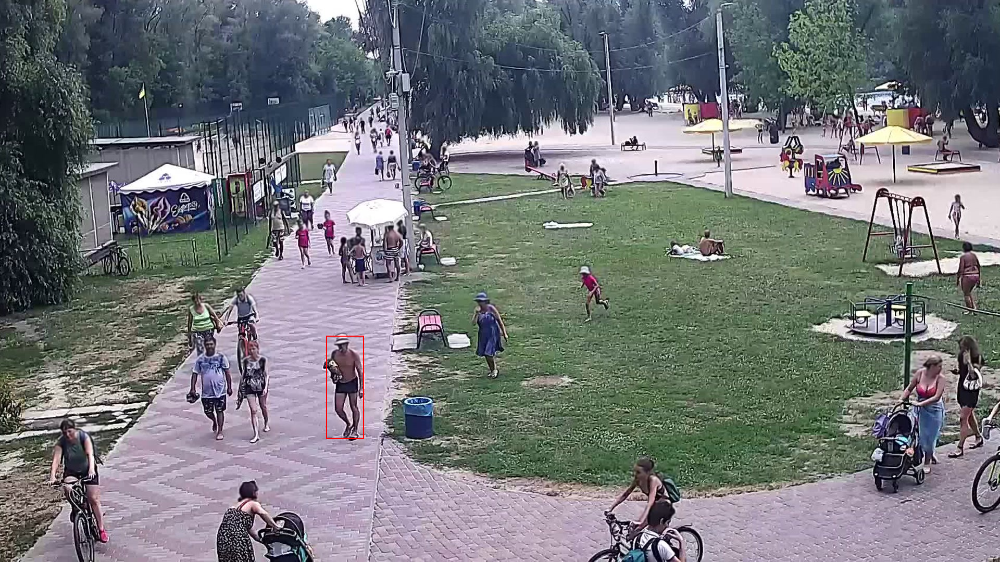

In [9]:
first_image = Image.open(first_image_fp)
first_bbox = ImageDraw.Draw(first_image)
first_bbox.rectangle([(x, y), (x + width, y + height)], outline='red', width=2)
display(first_image)

### Writing generalized code to render scenes

In [29]:
from collections import defaultdict
from pydantic import BaseModel

np.random.seed(0)
COLORS = [
    tuple(np.random.choice(range(256), size=3))
    for i in range(1000)
]

class ImageAnnotation(BaseModel):
    frame: int
    person_id: int
    x: int
    y: int
    width: int
    height: int

    def as_coordinates(self):
        return self.x, self.y, self.x + self.width, self.y + self.height
    
    def center_top(self):
        return self.x + self.width / 2, self.y + self.height / 2

class SomptImage:

    def __init__(self, scene: 'SomptScene', frame: int) -> None:
        self._scene = scene
        self._frame = frame
        self._fp = self._scene.image_dir / f'{str(frame).zfill(6)}.jpg'
        assert self._fp.exists() and self._fp.is_file(), \
            f'{self._fp} does not exist'

    def image(self) -> Image:
        return Image.open(self._fp)
    
    def render(self):
        img = self.image()
        draw = ImageDraw.Draw(img)
        for anno in self._scene.get_annotations(self._frame):
            draw.rectangle(anno.as_coordinates(), outline=COLORS[anno.person_id], width=2)
            # draw.text(anno.center_top(), str(anno.person_id), fill='red', font=)
        return img
        
class SomptScene:
    def __init__(self, number: int, train: bool = True) -> None:
        self._dir = DATASET_DIR / ('train' if train else 'test') / f'SOMPT22-{str(number).zfill(2)}'
        assert self._dir.exists() and self._dir.is_dir(), \
            f'Cannot find scene "{number}"'
        
        annotations: dict[str, list[ImageAnnotation]] = defaultdict(list)
        with open(self.annotation_fp, 'r') as gt_f:
            reader = csv.DictReader(gt_f, fieldnames=list(ImageAnnotation.model_fields))
            for row in reader:
                row.pop(None)   # Remove extraneous fields
                annotations[int(row['frame'])].append(ImageAnnotation(**row))
        self._annotations = dict(annotations)   # defaultdict can lead to hard to catch bugs

    @property
    def image_dir(self) -> Path:
        return self._dir / 'img1'
    
    @property
    def annotation_fp(self) -> Path:
        return self._dir / 'gt' / 'gt.txt'

    def __len__(self) -> int:
        return len(list(self.image_dir.glob('*.jpg')))
    
    def get_frame(self, number: int) -> SomptImage:
        assert 0 < number <= len(self), f'Invalid index, must be between 1 and {len(self)}'
        return SomptImage(self, number)
    
    def get_annotations(self, number: int) -> list[ImageAnnotation]:
        assert 0 < number <= len(self), f'Invalid index, must be between 1 and {len(self)}'
        return self._annotations[number]


In [30]:
scene = SomptScene(7)
len(scene)

1800

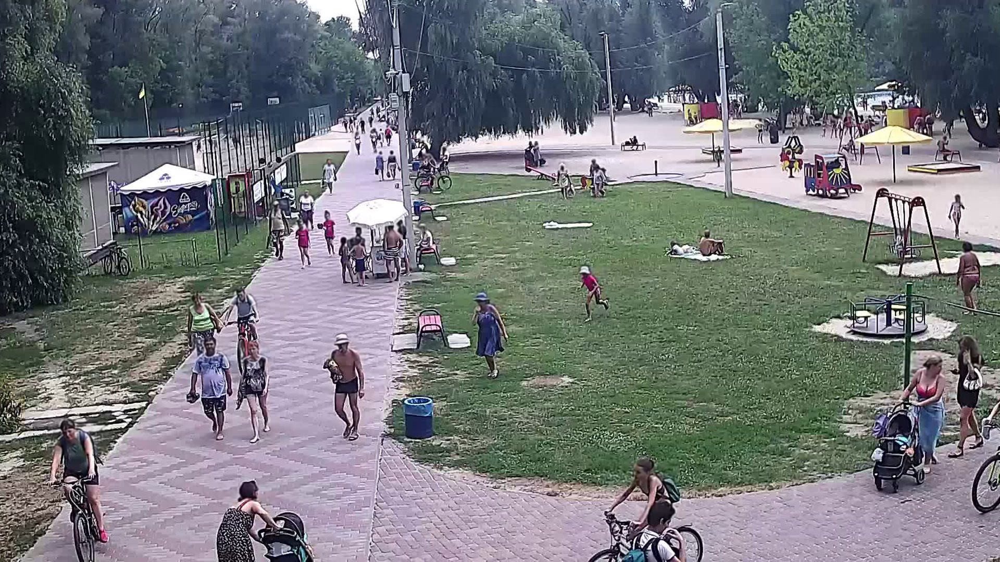

In [31]:
scene.get_frame(1).image()

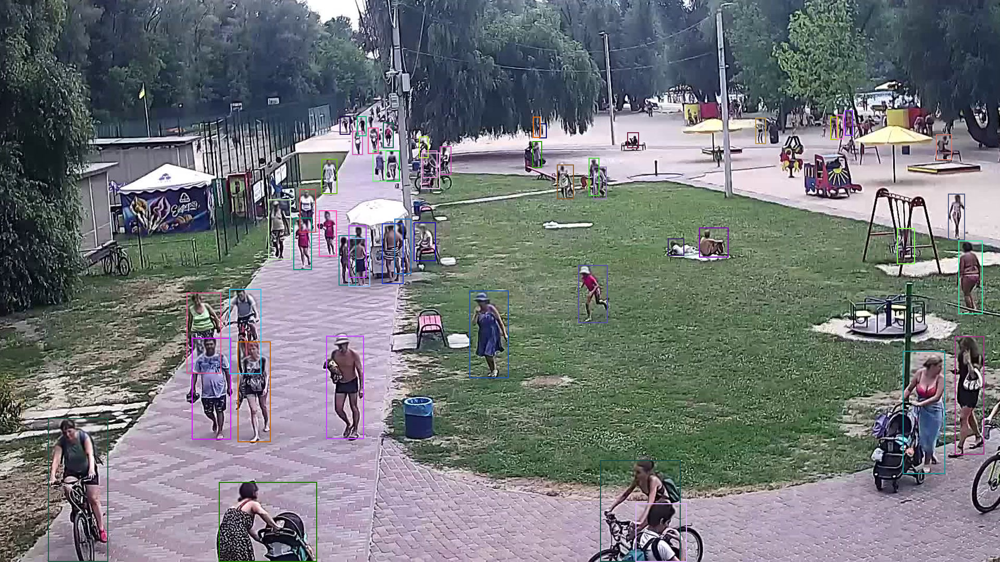

In [32]:
scene.get_frame(1).render()

## EDA: Bounding boxes

In [67]:
training_scenes = [2, 4, 5, 7, 8, 10, 11, 12, 13]
anno_dfs = list()
for num in training_scenes:
    scene = SomptScene(num)
    scene_df = pd.read_csv(
        scene.annotation_fp,
        names=ImageAnnotation.model_fields,
        usecols=[i for i in range(len(ImageAnnotation.model_fields))]
    )
    scene_df['scene'] = num
    anno_dfs.append(scene_df)
anno_df = pd.concat(anno_dfs)
anno_df

,frame,person_id,x,y,width,height,scene
0,1,1,851,389,47,111,2
1,1,2,889,494,85,122,2
2,1,3,973,394,81,125,2
3,1,4,1161,393,70,116,2
4,1,5,1174,302,40,80,2
...,...,...,...,...,...,...,...
8239,900,32,1065,518,60,162,13
8240,900,36,1838,694,80,382,13
8241,900,37,399,828,141,251,13
8242,900,38,110,779,159,297,13


In [89]:
anno_df['aspect_ratio'] = anno_df['height'] / anno_df['width']
anno_df['area'] = anno_df['height'] * anno_df['width']
anno_df['diagonal'] = (anno_df['height']**2 * anno_df['width']**2)**0.5

In [69]:
import matplotlib.pyplot as plt

Text(0.5, 0, 'Count')

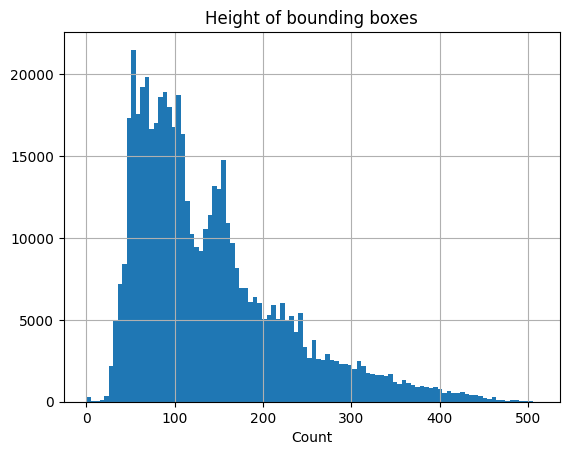

In [93]:
anno_df.hist('height', bins=100)
plt.title('Height of bounding boxes')
plt.xlabel('Count')

Text(0.5, 0, 'Count')

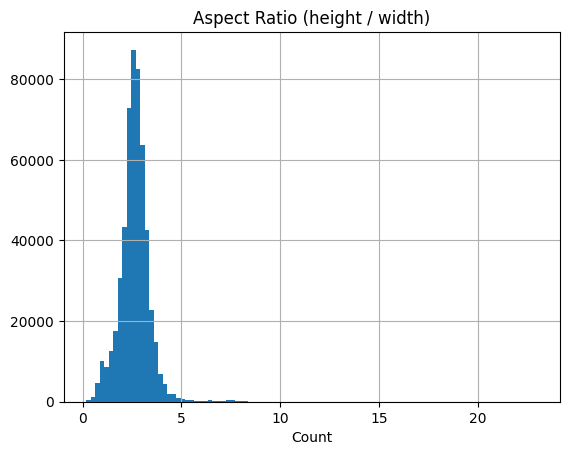

In [65]:
anno_df.hist('aspect_ratio', bins=100)
plt.title('Aspect Ratio (height / width)')
plt.xlabel('Count')

Text(0.5, 0, 'Count')

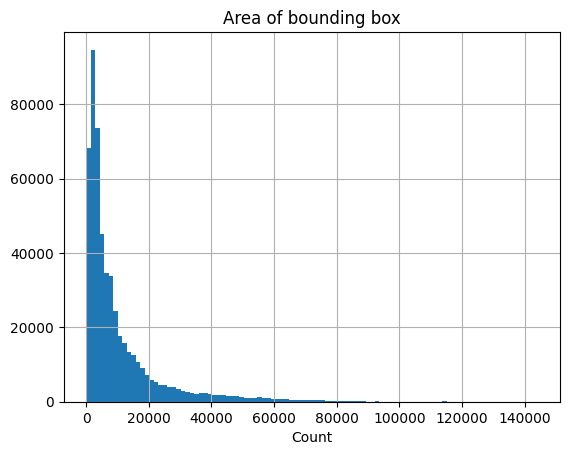

In [66]:
anno_df.hist('area', bins=100)
plt.title('Area of bounding box')
plt.xlabel('Count')

## EDA: Frames and scenes

In [80]:
import pandasql as ps

In [94]:
density_df = ps.sqldf('''
SELECT count(*) as density
FROM anno_df
GROUP BY scene, frame
''')

Text(0.5, 0, 'Count')

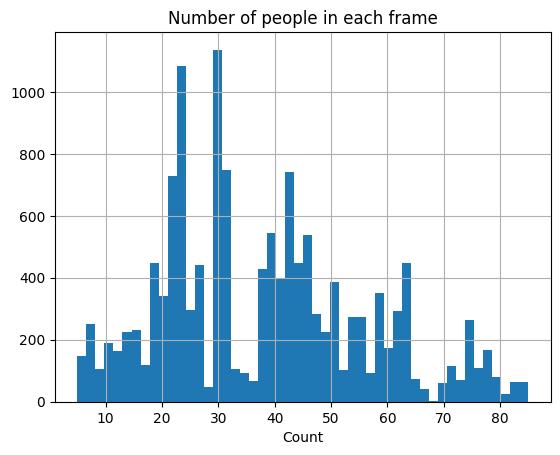

In [95]:
density_df.hist('density', bins=50)
plt.title('Number of people in each frame')
plt.xlabel('Count')

In [99]:
track_df = ps.sqldf('''
SELECT count(distinct frame) as track_length
FROM anno_df
GROUP BY scene, person_id
''')

Text(0.5, 0, 'Count')

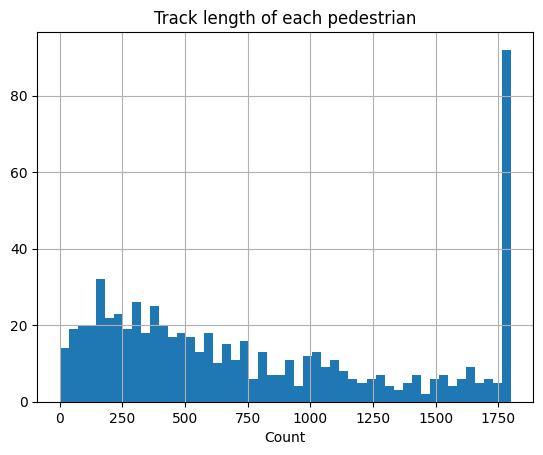

In [100]:
track_df.hist('track_length', bins=50)
plt.title('Track length of each pedestrian')
plt.xlabel('Count')

In [104]:
scene_df = ps.sqldf('''
SELECT scene as scene, count(distinct frame) as frames
FROM anno_df
GROUP BY scene
''')

In [105]:
scene_df

,scene,frames
0,2,600
1,4,1800
2,5,1800
3,7,1800
4,8,1800
5,10,1800
6,11,1800
7,12,1800
8,13,900


Text(0.5, 0, 'Count')

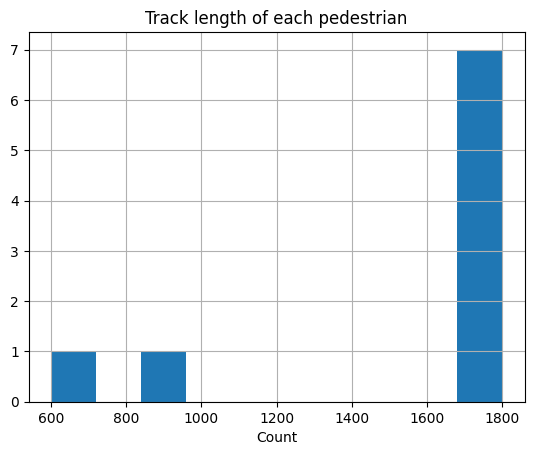

In [102]:
scene_df.hist('frames', bins=10)
plt.title('Track length of each pedestrian')
plt.xlabel('Count')